In [22]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [23]:
df = pd.read_pickle("../data/train_df.pkl")

In [24]:
df.shape

(227845, 31)

In [25]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
265518,161919.0,1.946747,-0.752526,-1.355130,-0.661630,1.502822,4.024933,-1.479661,1.139880,1.406819,...,0.076197,0.297537,0.307915,0.690980,-0.350316,-0.388907,0.077641,-0.032248,7.32,0.0
180305,124477.0,2.035149,-0.048880,-3.058693,0.247945,2.943487,3.298697,-0.002192,0.674782,0.045826,...,0.038628,0.228197,0.035542,0.707090,0.512885,-0.471198,0.002520,-0.069002,2.99,0.0
42664,41191.0,-0.991920,0.603193,0.711976,-0.992425,-0.825838,1.956261,-2.212603,-5.037523,0.000772,...,-2.798352,0.109526,-0.436530,-0.932803,0.826684,0.913773,0.038049,0.185340,175.10,0.0
198723,132624.0,2.285718,-1.500239,-0.747565,-1.668119,-1.394143,-0.350339,-1.427984,0.010010,-1.118447,...,-0.139670,0.077013,0.208310,-0.538236,-0.278032,-0.162068,0.018045,-0.063005,6.10,0.0
82325,59359.0,-0.448747,-1.011440,0.115903,-3.454854,0.715771,-0.147490,0.504347,-0.113817,-0.044782,...,-0.243245,-0.173298,-0.006692,-1.362383,-0.292234,-0.144622,-0.032580,-0.064194,86.10,0.0


In [26]:
df.groupby('Class').size()

Class
0.0    227451
1.0       394
dtype: int64

In [4]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     284807 non-nu

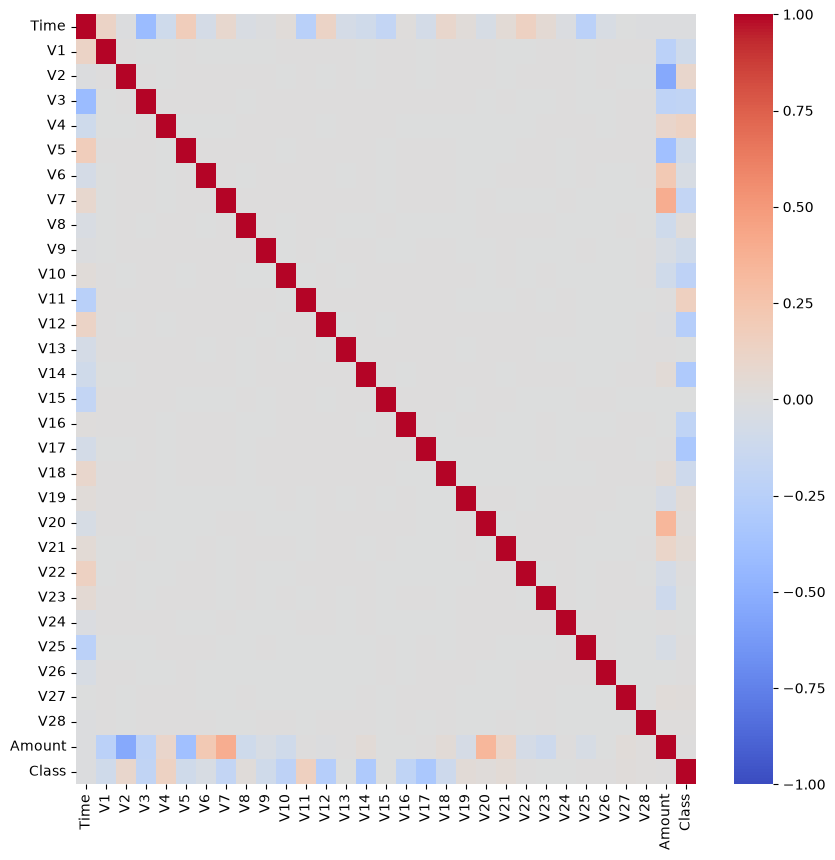

In [16]:
correlation_matrix = df.corr(numeric_only=True)

plt.figure(figsize=(10, 10))
sns.heatmap(
    correlation_matrix,
    # annot=True,
    cmap="coolwarm",
    vmin=-1,
    vmax=1
)

plt.show()

In [17]:
sns.pairplot(
    df.sample(n=250, random_state=42).reset_index(drop=True),
    hue="Class",
    height=2.5,
    diag_kind="kde",
    plot_kws={"alpha": 0.6}
)

plt.show()

# univariate variable importance

In [28]:
import statsmodels.api as sm
import pandas as pd

In [88]:
walds = pd.DataFrame(columns = ['var','wald'])

for i in df.drop(columns = 'Class').columns:
    
    # print(i)
  
    X = sm.add_constant(df[i])
    y = df["Class"]

    # Fit logistic regression
    model = sm.Logit(y, X).fit()
    
    # print(model.summary())

    wald_chi_square = model.tvalues[i] ** 2

    # print("Wald chi-square:", wald_chi_square)

    new_row = pd.DataFrame([{
        "var": i,
        "wald": wald_chi_square
    }])

    walds = pd.concat([walds, new_row], ignore_index=True)

    # break

Optimization terminated successfully.
         Current function value: 0.012670
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.011462
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.010202
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.008898
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.008373
         Iterations 12
Optimization terminated successfully.
         Current function value: 0.011583
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.012073
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.009733
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.012510
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.

In [89]:
walds.sort_values(by = 'wald', ascending = False, inplace = True)

# correlation by importance

In [90]:
correlation_matrix = df[walds['var'].tolist()].corr(numeric_only=True)

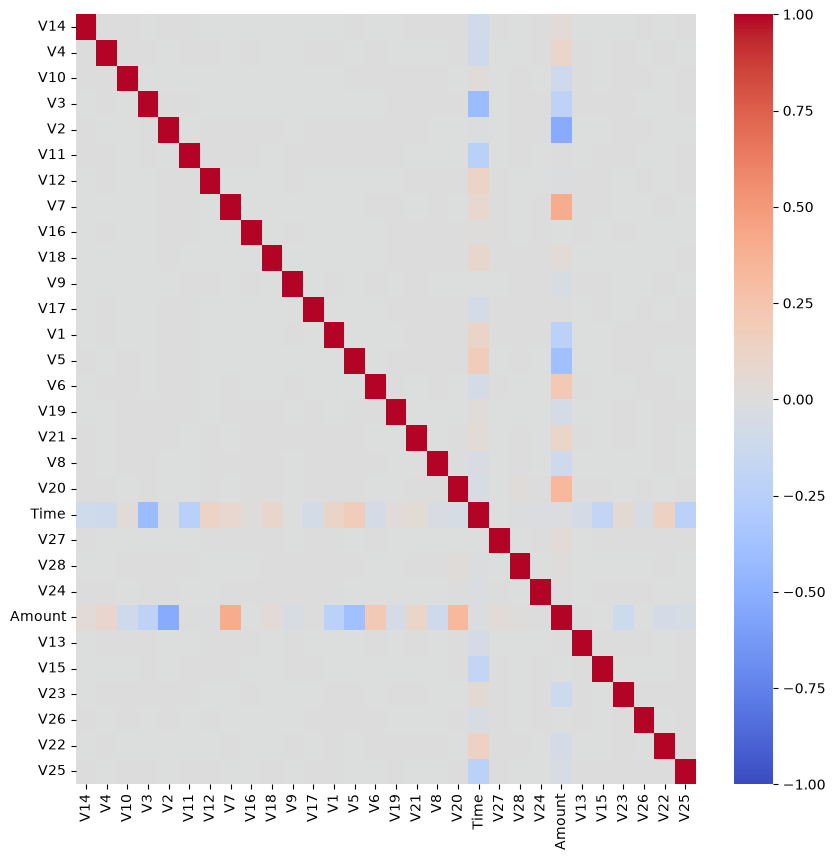

In [91]:
plt.figure(figsize=(10, 10))
sns.heatmap(
    correlation_matrix,
    # annot=True,
    cmap="coolwarm",
    vmin=-1,
    vmax=1
)

plt.show()

In [92]:
correlation_matrix.head()

,V14,V4,V10,V3,V2,V11,V12,V7,V16,V18,...,V27,V28,V24,Amount,V13,V15,V23,V26,V22,V25
V14,1.000000,0.001400,0.000148,-0.002869,0.001936,0.002802,-0.002292,-0.002143,-0.003194,-0.000430,...,0.003611,-0.001011,0.000056,0.032659,-0.001923,-0.000094,-0.000048,0.000358,-0.002131,0.001204
V4,0.001400,1.000000,0.001073,0.000563,-0.001218,0.000027,0.000110,-0.000022,0.001098,-0.000295,...,-0.001701,-0.005669,0.001635,0.099970,0.000105,-0.000139,0.000665,-0.000138,0.001295,-0.001727
V10,0.000148,0.001073,1.000000,-0.001276,-0.001682,-0.000254,-0.000697,-0.001023,-0.000416,-0.000427,...,-0.002690,0.004293,-0.001581,-0.102396,0.000493,-0.000313,0.000846,0.000800,-0.000602,0.001258
V3,-0.002869,0.000563,-0.001276,1.000000,0.002215,0.000472,-0.000218,-0.004195,-0.002985,-0.000464,...,-0.001733,0.007445,0.000214,-0.211310,0.000426,0.000875,0.000476,-0.000229,-0.001957,0.001974
V2,0.001936,-0.001218,-0.001682,0.002215,1.000000,-0.001694,0.000621,0.003261,0.001515,0.000433,...,-0.000879,0.005784,0.002428,-0.530143,-0.000907,-0.000647,0.000549,0.000960,-0.000011,-0.000463


In [93]:
corr_tmp = correlation_matrix.copy()

In [94]:
corr_ind = pd.DataFrame(columns = ['var','corr','corr ind'])

thresh = .3

for i in corr_tmp.columns:
    # print(i)

    # mx = corr_tmp[i].max()
    mx = corr_tmp[i].drop(index=i).max()
    mi = corr_tmp[i].drop(index=i).min()

    if abs(mx) > abs(mi):
        res = mx
    else:
        res = mi

    

    # print(res)

    if abs(res) > thresh:
        indy = True
    else:
        indy = False

    
    new_row = pd.DataFrame([{
    "var": i,
    'corr': res,
    "corr ind": indy
    }])

    corr_ind = pd.concat([corr_ind, new_row], ignore_index=True)

    # break

In [95]:
walds = pd.merge(walds, corr_ind, on="var", how="left")

In [96]:
walds

,var,wald,corr,corr ind
0,V14,1951.546659,-0.099085,False
1,V4,1703.435651,-0.106422,False
2,V10,1617.13706,-0.102396,False
3,V3,1541.035483,-0.420856,True
4,V2,1478.19184,-0.530143,True
5,V11,1453.420843,-0.247649,False
6,V12,1403.316979,0.123089,False
7,V7,1391.898556,0.398941,True
8,V16,1349.501453,0.012829,False
9,V18,1301.444612,0.089691,False


In [97]:
walds.to_pickle("../data/walds.pkl")